In [1]:
#Collect the dates and hours of the event into two lists
dates = ['20101224','20101225','20101226','20101227','20101228']
hours = ['0000','0600','1200','1800']

#Store the website to take data from inside a variable
url_root = "https://www.ncei.noaa.gov/data/north-american-mesoscale-model/access/historical/analysis/"

#Combine the lists and website variable into one list to pull the correct files
files_to_download = [url_root + date[0:6] + '/' + date + '/' + 'namanl_218_' + date + '_' + hour + '_000.grb' for date in dates for hour in hours]

#Use for loop to download files from internet
for file in files_to_download:
    #!wget $file
    !curl -# -O $file
    print(file)

######################################################################### 100.0%
https://www.ncei.noaa.gov/data/north-american-mesoscale-model/access/historical/analysis/201012/20101224/namanl_218_20101224_0000_000.grb
######################################################################### 100.0%                                      0.1%                                             18.5%
https://www.ncei.noaa.gov/data/north-american-mesoscale-model/access/historical/analysis/201012/20101224/namanl_218_20101224_0600_000.grb
######################################################################### 100.0%####################                             63.9%
https://www.ncei.noaa.gov/data/north-american-mesoscale-model/access/historical/analysis/201012/20101224/namanl_218_20101224_1200_000.grb
######################################################################### 100.0%
https://www.ncei.noaa.gov/data/north-american-mesoscale-model/access/historical/analysis/201012/20101224/namanl_218_

/opt/anaconda3/envs/metuse/lib/python3.9/site-packages/metpy/calc/thermo.py:1114: RuntimeWarning: divide by zero encountered in log
  val = np.log(vapor_pressure / mpconsts.nounit.sat_pressure_0c)


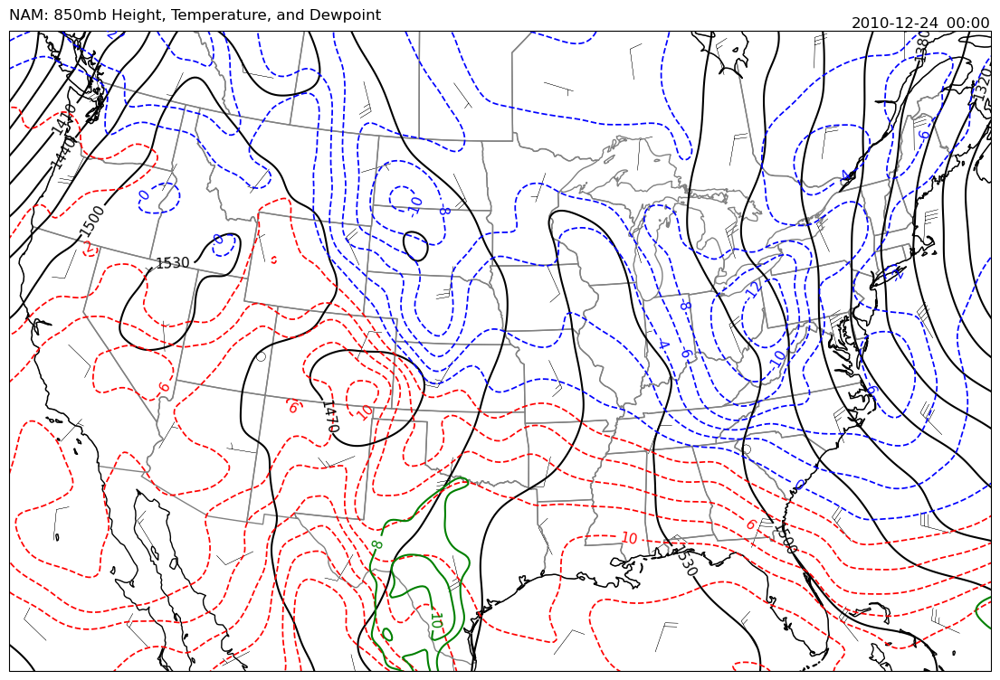

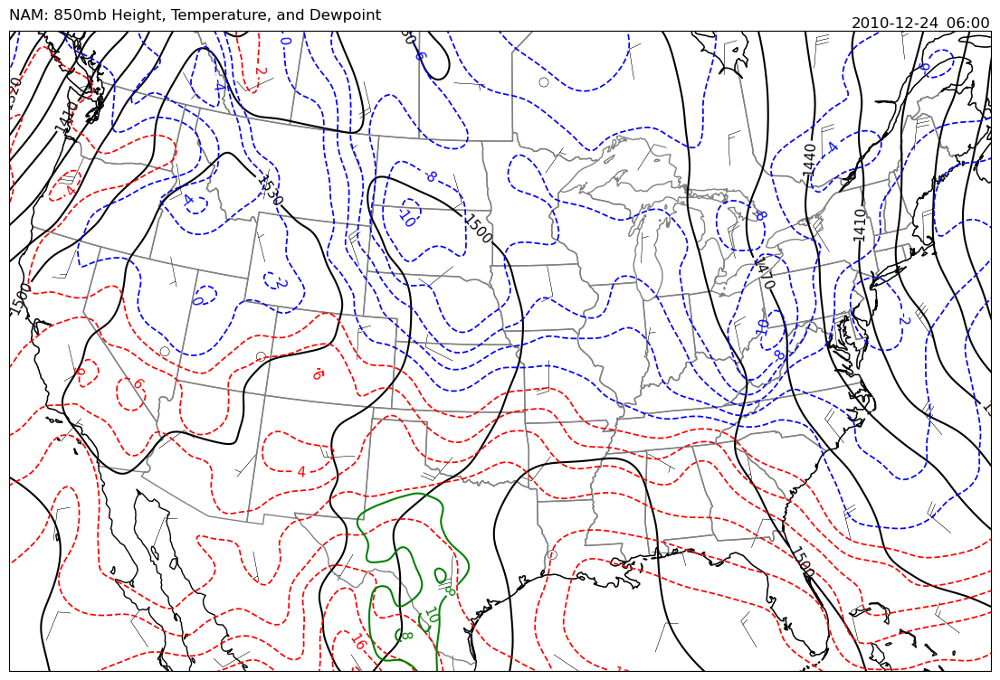

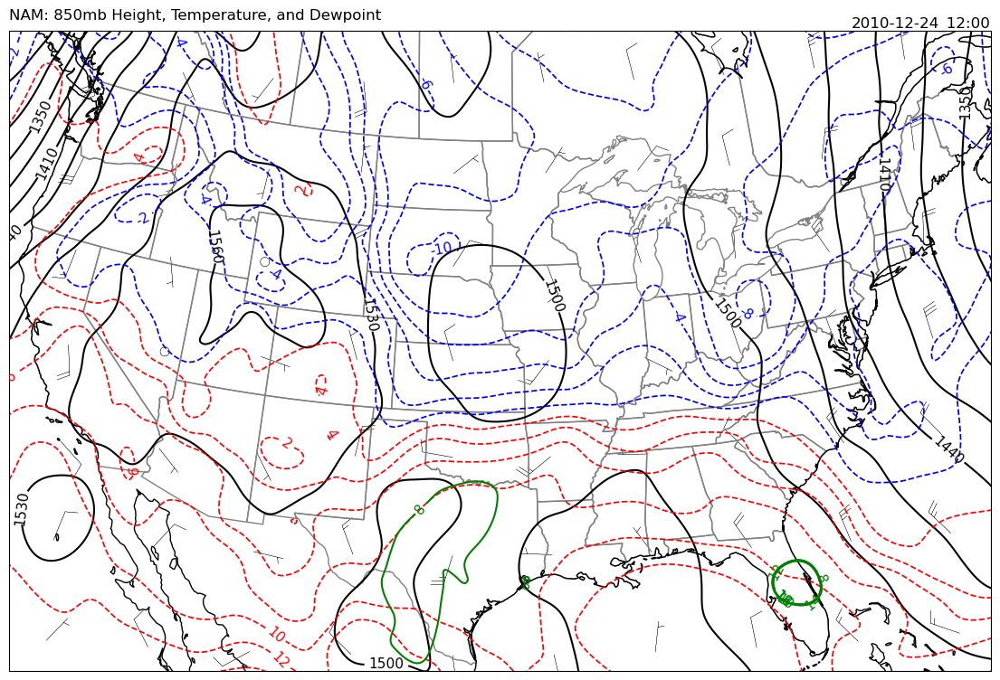

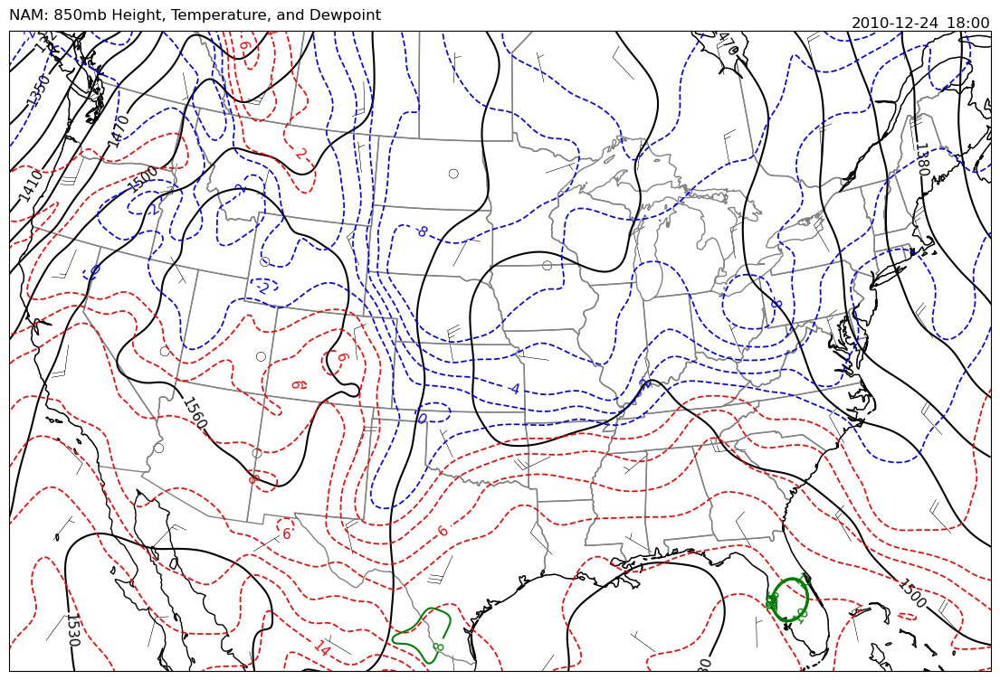

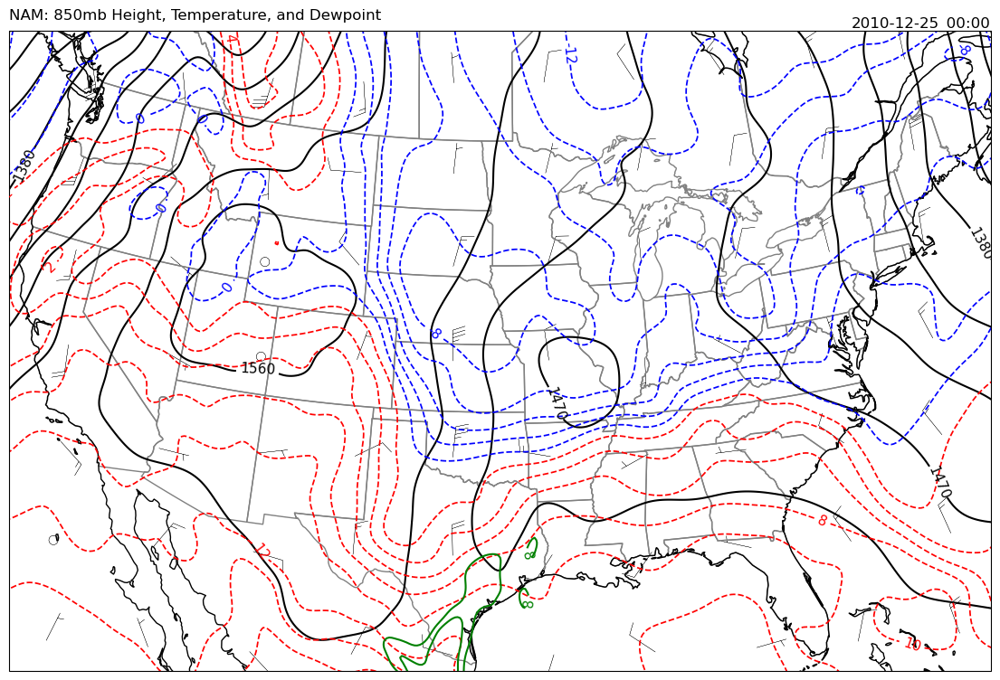

...

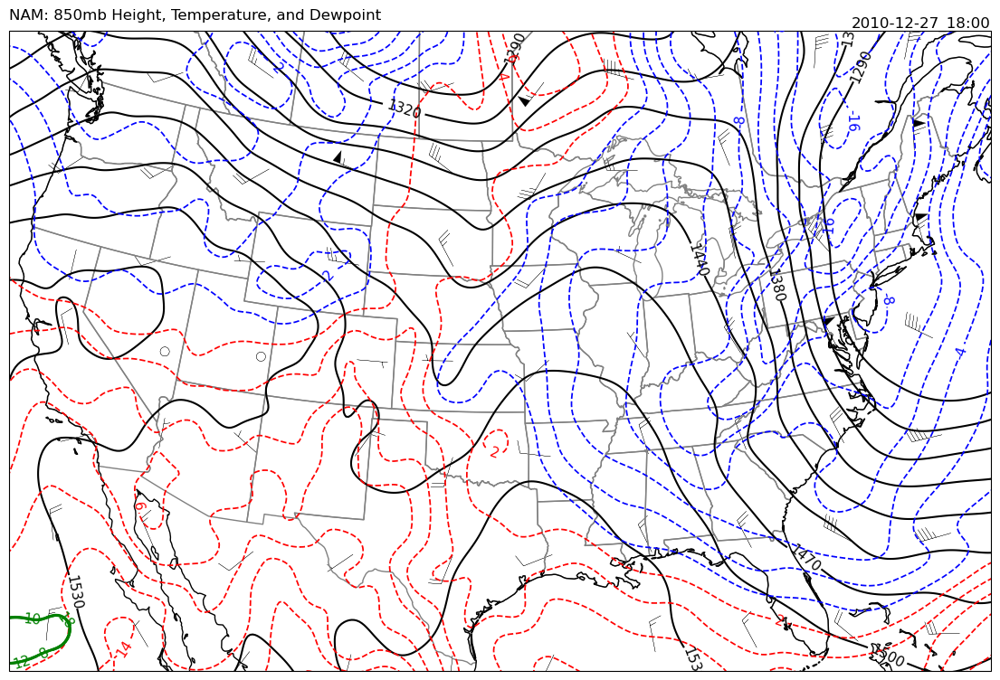

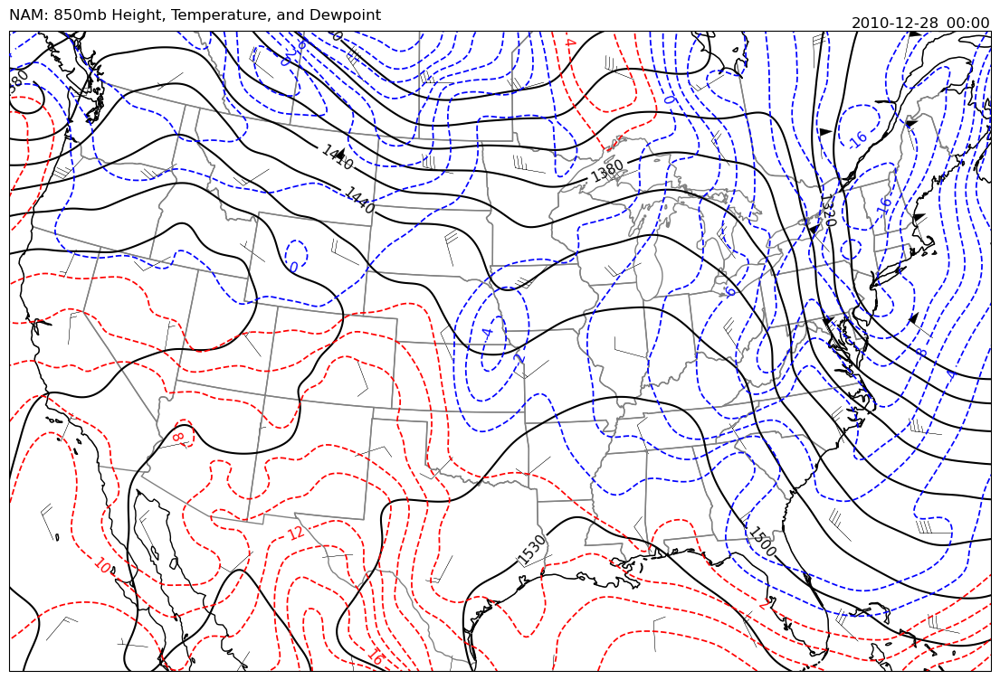

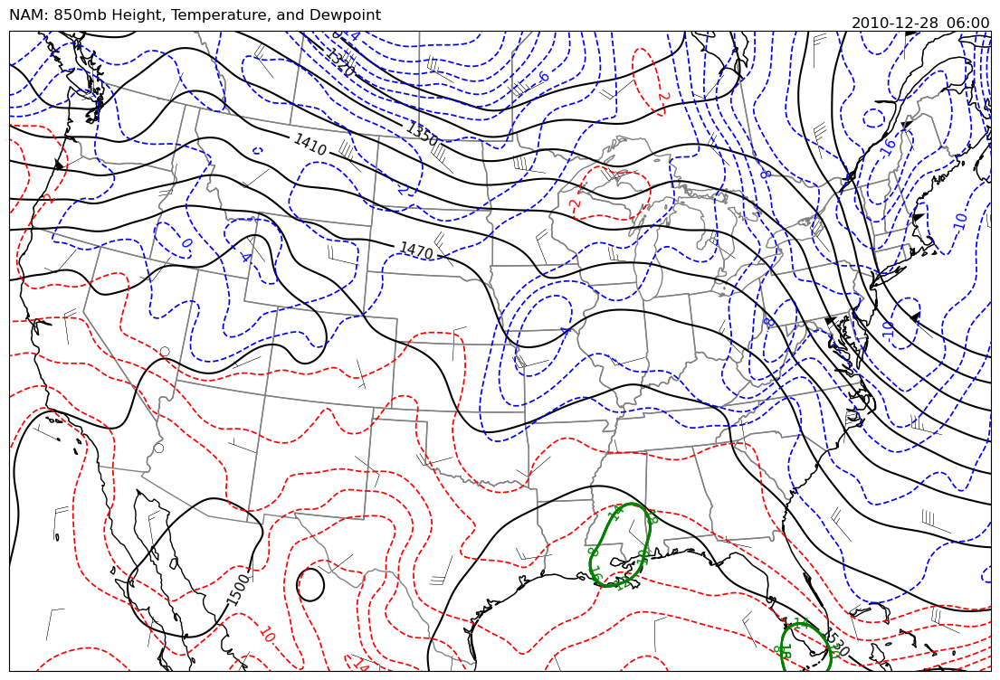

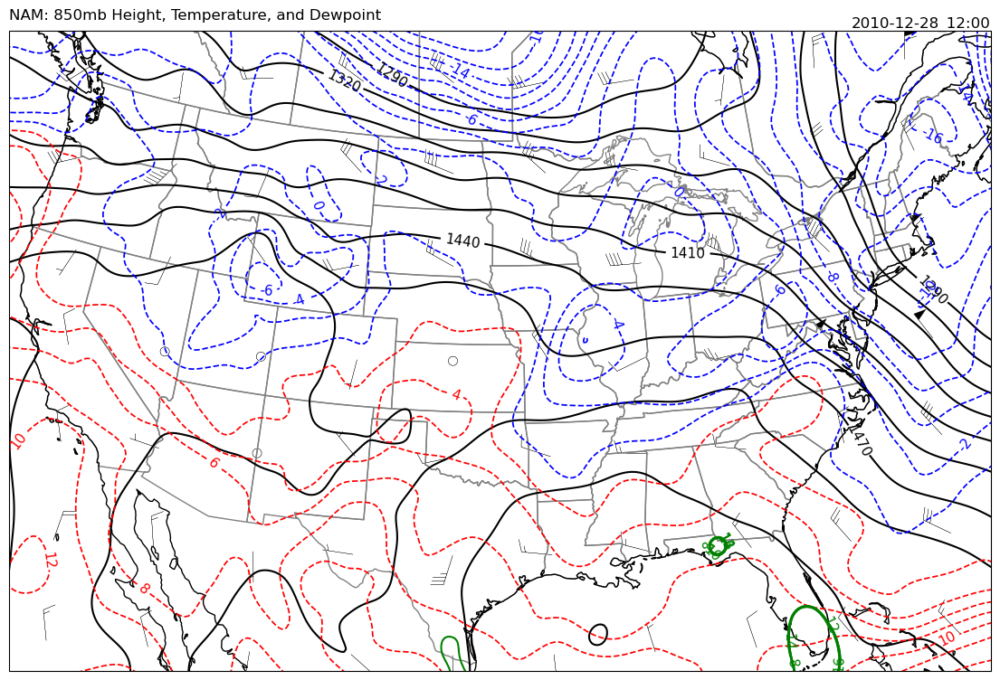

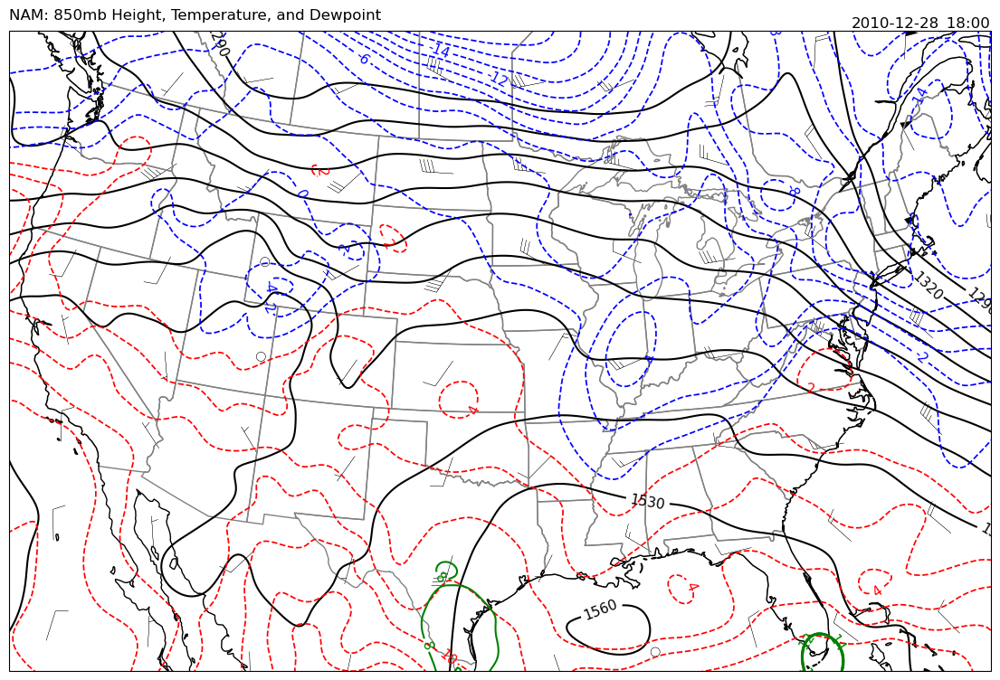

In [5]:
#Import all necessary python libraries
import Nio
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime, timedelta
from glob import glob
from metpy.units import units
import metpy.calc as metcalc
from scipy.ndimage import gaussian_filter
from scipy.ndimage import minimum_filter, maximum_filter

#Sort all files by date
path = './'
files = sorted(glob(path+'namanl_218_2010*.grb'))

#Collect some common fields from first file 
f = Nio.open_file(files[0])

nx = f.dimensions['gridx_218']                   # dimensions
ny = f.dimensions['gridy_218']
npres = f.dimensions['lv_ISBL2']

lats=f.variables['gridlat_218'].get_value()      # coordinates
lons=f.variables['gridlon_218'].get_value()
rot =f.variables['gridrot_218'].get_value()
pres=f.variables['lv_ISBL2'].get_value()

#print(files[15:19])

#Close the file
f.close()

#Define the projections used
map_proj = ccrs.LambertConformal()
data_proj = ccrs.PlateCarree()

###Start Defining level functions here
#Define function to find extrema
def extrema(mat,mode='wrap',window=150):

    """find the indices of local extrema (min and max)

    in the input array."""

    mn = minimum_filter(mat, size=window, mode=mode)

    mx = maximum_filter(mat, size=window, mode=mode)

    # (mat == mx) true if pixel is equal to the local max

    # (mat == mn) true if pixel is equal to the local in

    # Return the indices of the maxima, minima

    return np.nonzero(mat == mn), np.nonzero(mat == mx)

#Define a function to display
def mb300(file):
    #Define the pressure variable
    mbLvl = 300
    paLvl = np.where(pres==mbLvl)[0][0]
    
    #Open the file
    f = Nio.open_file(file)
    
    #Pull the time from a variable
    tinit=f.variables['TMP_218_ISBL'].attributes['initial_time']
    time = datetime.strptime(tinit, '%m/%d/%Y (%H:%M)')
    
    #Double check that the time is pulled correctly
    filenm_time = datetime.strptime(file[13:26], '%Y%m%d_%H%M')
    if filenm_time != time:
        sys.exit(-1, 'file time problem, stopped')
    
    #Grab the needed variables for the pressure level
    hght = f.variables['HGT_218_ISBL'].get_value()[paLvl,:,:]
    U = f.variables['U_GRD_218_ISBL'].get_value()[paLvl,:,:] * 1.944 #Convert to knots
    V = f.variables['V_GRD_218_ISBL'].get_value()[paLvl,:,:] * 1.944 #Convert to knots
    
    #Change wind to account for rotation
    UE = np.sin(rot)*V + np.cos(rot)*U
    VE = np.cos(rot)*V - np.sin(rot)*U
    
    #Define dx and dy. I don't know what this does but you need it for the accursed thing to work
    dx, dy = 12.191, 12.191
    
    #Calculate Divergence
    div = metcalc.divergence(UE, VE, dx = 12.191*units.km, dy= 12.191*units.km)
    
    #Define wind speed
    spd = np.hypot(UE,VE)
    
    #Smooth hght, spd, and div
    hght = gaussian_filter(hght, sigma=5)
    spd = gaussian_filter(spd, sigma=5)
    div = gaussian_filter(div, sigma=5)
    
    #Define figure for display and add subplot
    fig = plt.figure(figsize=(14,12))
    ax = fig.add_subplot(111,projection=map_proj)
    
    #Set extent of the map to just the US
    ax.set_extent([-119,-73,23,52])
    
    #Add map features
    ax.add_feature(cfeature.STATES, edgecolor='gray')
    ax.coastlines(color='black')
    
    #Define skip variable
    s = 40
    
    #Plot the varaibles for the pressure height, wind barbs, divergence, and windspeed
    spdct = ax.contourf(lons, lats, spd, levels=np.arange(60,181,20), vmin=60,vmax=200, transform=data_proj, cmap='cool', alpha=0.8)
    gpm300 = ax.contour(lons,lats,hght,levels=range(8580,9540,60),transform=data_proj,colors='k')
    plt.clabel(gpm300,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    div300 = ax.contour(lons,lats,div*10**1.85,levels=range(2,11,2),transform=data_proj,colors='purple')
    plt.clabel(div300,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    ax.barbs(lons[::s,::s], lats[::s,::s],UE[::s,::s],VE[::s,::s],transform=data_proj,lw=0.2)
    
    #create colorbar for wind speed
    spdCB = plt.colorbar(spdct,shrink=0.76,pad=0.05)
    spdCB.set_label(r'Speed (kt)')
    
    #Create map title
    ax.set_title('NAM: {:.0f}mb Height and Winds'.format(mbLvl),loc='left')
    ax.set_title(time.strftime('%Y-%m-%d_%H:%M'), transform=ax.transAxes,loc='right')
    
    #Save the image to the correct folder
    relPath = 'Desktop/300mb_maps/'
    outfile = 'NAM_{:.0f}mb_{:s}.png'.format(mbLvl, time.strftime('%Y%m%d_%H%M'))
    plt.savefig(relPath+outfile, bbox_inches='tight', pad_inches=0.1)
    
    #Close the file
    f.close
    
def mb500(file):
    #Define the pressure variable
    mbLvl = 500
    paLvl = np.where(pres==mbLvl)[0][0]
    
    #Open the file
    f = Nio.open_file(file)
    
    #Pull the time from a variable
    tinit=f.variables['TMP_218_ISBL'].attributes['initial_time']
    time = datetime.strptime(tinit, '%m/%d/%Y (%H:%M)')
    
    #Double check that the time is pulled correctly
    filenm_time = datetime.strptime(file[13:26], '%Y%m%d_%H%M')
    if filenm_time != time:
        sys.exit(-1, 'file time problem, stopped')
    
    #Grab the needed variables for the pressure level
    hght = f.variables['HGT_218_ISBL'].get_value()[paLvl,:,:]
    temp = f.variables['TMP_218_ISBL'].get_value()[paLvl,:,:]
    U = f.variables['U_GRD_218_ISBL'].get_value()[paLvl,:,:] * 1.944 #Convert to knots
    V = f.variables['V_GRD_218_ISBL'].get_value()[paLvl,:,:] * 1.944 #Convert to knots
    
    #Change wind to account for rotation
    UE = np.sin(rot)*V + np.cos(rot)*U
    VE = np.cos(rot)*V - np.sin(rot)*U
    
    
    #Define wind speed
    spd = np.hypot(UE,VE)
    
    #Smooth hght, spd, and temp
    hght = gaussian_filter(hght, sigma=5)
    spd = gaussian_filter(spd, sigma=5)
    temp = gaussian_filter(temp-273.15, sigma=5) #convert from Kelvin to Celsius
    
    #Define figure for display and add subplot
    fig = plt.figure(figsize=(14,12))
    ax = fig.add_subplot(111,projection=map_proj)
    
    #Set extent of the map to just the US
    ax.set_extent([-119,-73,23,52])
    
    #Add map features
    ax.add_feature(cfeature.STATES, edgecolor='gray')
    ax.coastlines(color='black')
    
    #Define skip variable
    s = 40
    
    #Plot the varaibles for the pressure height, wind barbs, temperature, and windspeed
    spdct = ax.contourf(lons, lats, spd, levels=np.arange(40,161,20), vmin=40,vmax=180, transform=data_proj, cmap='cool', alpha=0.8)
    gpm500 = ax.contour(lons,lats,hght,levels=range(5100,5820,60),transform=data_proj,colors='k')
    tmp500 = ax.contour(lons,lats,temp,levels=range(-34,-8,2),transform=data_proj,colors='r',linewidths=1.25,linestyles='dashed')
    plt.clabel(tmp500,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    plt.clabel(gpm500,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    ax.barbs(lons[::s,::s], lats[::s,::s],UE[::s,::s],VE[::s,::s],transform=data_proj,lw=0.2)
    
    #create colorbar for wind speed
    spdCB = plt.colorbar(spdct,shrink=0.76,pad=0.05)
    spdCB.set_label(r'Speed (kt)')
    
    #Create map title
    ax.set_title('NAM: {:.0f}mb Height and Winds'.format(mbLvl),loc='left')
    ax.set_title(time.strftime('%Y-%m-%d_%H:%M'), transform=ax.transAxes,loc='right')
    
    #Save the image to the correct folder
    relPath = 'Desktop/500mb_maps/'
    outfile = 'NAM_{:.0f}mb_{:s}.png'.format(mbLvl, time.strftime('%Y%m%d_%H%M'))
    plt.savefig(relPath+outfile, bbox_inches='tight', pad_inches=0.1) 
    
    #Close the file
    f.close
    
def mb850(file):
    #Define the pressure variable
    mbLvl = 850
    paLvl = np.where(pres==mbLvl)[0][0]
    
    #Open the file
    f = Nio.open_file(file)
    
    #Pull the time from a variable
    tinit=f.variables['TMP_218_ISBL'].attributes['initial_time']
    time = datetime.strptime(tinit, '%m/%d/%Y (%H:%M)')
    
    #Double check that the time is pulled correctly
    filenm_time = datetime.strptime(file[13:26], '%Y%m%d_%H%M')
    if filenm_time != time:
        sys.exit(-1, 'file time problem, stopped')
    
    #Grab the needed variables for the pressure level
    hght = f.variables['HGT_218_ISBL'].get_value()[paLvl,:,:]
    temp = f.variables['TMP_218_ISBL'].get_value()[paLvl,:,:]
    relh = f.variables['R_H_218_ISBL'].get_value()[paLvl,:,:]
    U = f.variables['U_GRD_218_ISBL'].get_value()[paLvl,:,:] * 1.944 #Convert to knots
    V = f.variables['V_GRD_218_ISBL'].get_value()[paLvl,:,:] * 1.944 #Convert to knots
    
    #Change wind to account for rotation
    UE = np.sin(rot)*V + np.cos(rot)*U
    VE = np.cos(rot)*V - np.sin(rot)*U
    
    
    #Define wind speed
    spd = np.hypot(UE,VE)
    
    #Calculate dewpoint from relative humidity
    temp = units.Quantity(temp-273.15, "degC") #convert from Kelvin to Celsius
    relh = units.Quantity(relh, "%")
    
    dewp = metcalc.dewpoint_from_relative_humidity(temp,relh) 
    
    #Smooth hght, spd, temp, and dewp
    hght = gaussian_filter(hght, sigma=5)
    spd = gaussian_filter(spd, sigma=5)
    temp = gaussian_filter(temp, sigma=5) 
    dewp = gaussian_filter(dewp, sigma=3)
    
    #Define figure for display and add subplot
    fig = plt.figure(figsize=(14,12))
    ax = fig.add_subplot(111,projection=map_proj)
    
    #Set extent of the map to just the US
    ax.set_extent([-119,-73,23,52])
    
    #Add map features
    ax.add_feature(cfeature.STATES, edgecolor='gray')
    ax.coastlines(color='black')
    
    #Define skip variable
    s = 40
    
    #copy over the temp and dewp values to get above freezing and below freezing layers
    wtemp = temp
    fdewp = dewp
    
    #Plot the varaibles for the pressure height, wind barbs, temperature, and windspeed
    gpm850 = ax.contour(lons,lats,hght,levels=range(1290,1590,30),transform=data_proj,colors='k')
    plt.clabel(gpm850,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    
    ctmp850 = ax.contour(lons,lats,temp,levels=range(-20,1,2),transform=data_proj,colors='b',linewidths=1.25,linestyles='dashed')
    plt.clabel(ctmp850,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    wtmp850 = ax.contour(lons,lats,wtemp,levels=range(2,20,2),transform=data_proj,colors='r',linewidths=1.25,linestyles='dashed')
    plt.clabel(wtmp850,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    
    #def850 = ax.contour(lons,lats,dewp,levels=range(-20,9,6),transform=data_proj, colors='gray',linestyles='dashed')
    #plt.clabel(def850,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    dew850 = ax.contour(lons,lats,dewp,levels=range(8,20,2),transform=data_proj, colors='g')
    plt.clabel(dew850,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    
    ax.barbs(lons[::s,::s], lats[::s,::s],UE[::s,::s],VE[::s,::s],transform=data_proj,lw=0.2)
    
    
    #Create map title
    ax.set_title('NAM: {:.0f}mb Height, Temperature, and Dewpoint'.format(mbLvl),loc='left')
    ax.set_title(time.strftime('%Y-%m-%d_%H:%M'), transform=ax.transAxes,loc='right')
    
    
    #Save the image to the correct folder
    relPath = 'Desktop/850mb_maps/'
    outfile = 'NAM_{:.0f}mb_{:s}.png'.format(mbLvl, time.strftime('%Y%m%d_%H%M'))
    plt.savefig(relPath+outfile, bbox_inches='tight', pad_inches=0.1)
    
    #Close the file
    f.close
    
def snodp(file):
    
    #Open the file
    f = Nio.open_file(file)
    
    #Pull the time from a variable
    tinit= f.variables['TMP_218_ISBL'].attributes['initial_time']
    time = datetime.strptime(tinit, '%m/%d/%Y (%H:%M)')
    
    #Double check that the time is pulled correctly
    filenm_time = datetime.strptime(file[13:26], '%Y%m%d_%H%M')
    if filenm_time != time:
        sys.exit(-1, 'file time problem, stopped')
    
    #Predefine levels for snow depth
    levels = np.linspace(0,40,20)
    
    #Grab the needed variables for the pressure level
    snow = f.variables['SNO_D_218_SFC'].get_value() 
    mslp = f.variables['PRMSL_218_MSL'].get_value()
    
    #Convert mslp to hPa and smooth
    mslp = gaussian_filter(mslp/100,sigma=3)
    
    #Convert snow depth from meters to inches
    snow = units.Quantity(snow, "m")
    snow.ito('inch')
    
    #Define figure for display and add subplot
    fig = plt.figure(figsize=(14,12))
    ax = fig.add_subplot(111,projection=map_proj)
    ax.margins(0)
    
    #Set extent of the map to just the US
    ext = ax.set_extent([-119,-73,23,52])
    
    #Add map features
    ax.add_feature(cfeature.STATES, edgecolor='gray')
    ax.coastlines(color='black')
    
    ###Begin code for locating Highs and Lows #Thank you Dr. Fan
    # the window parameter controls the number of highs and lows detected.
    # (higher value, fewer highs and lows)
    local_min, local_max = extrema(mslp, mode='wrap', window=150)

    lon_lows = lons[local_min]; lon_highs = lons[local_max]
    lat_lows = lats[local_min]; lat_highs = lats[local_max]
    lowvals  = mslp[local_min];  highvals  = mslp[local_max]
    
    # plot lows as red L's, with min pressure value underneath.
    yoffset = 1.2
    for lon,lat,p in zip(lon_lows, lat_lows, lowvals):
        ax.text(lon,lat,'L',fontsize=20,fontweight='bold',transform=data_proj,
                ha='center',va='center',color='r').set_clip_on(True)
        ax.text(lon,lat-yoffset,repr(int(p)),fontsize=10,transform=data_proj,
                ha='center',va='top',color='r',
                bbox = dict(boxstyle="square",ec='None',pad=0.01,fc=(1,1,1,0.8))).set_clip_on(True)
        
    # plot highs as blue H's, with max pressure value underneath.
    for lon,lat,p in zip(lon_highs, lat_highs, highvals):
        ax.text(lon,lat,'H',fontsize=20,fontweight='bold',transform=data_proj,
                ha='center',va='center',color='b').set_clip_on(True)
        ax.text(lon,lat-yoffset,repr(int(p)),fontsize=10,transform=data_proj,    # repr() similar as str()
                ha='center',va='top',color='b',
                bbox = dict(boxstyle="square",ec='None',pad=0.01, fc=(1,1,1,0.8))).set_clip_on(True)
    
    #plot mslp and snow depth
    sfcp = ax.contour(lons,lats,mslp,levels=range(960,1042,4),transform=data_proj,colors='k')
    plt.clabel(sfcp,fontsize=11,inline=True,fmt='%i',rightside_up=True)
    
    dpth = ax.contourf(lons,lats,snow,levels=levels[levels!=0],transform=data_proj,cmap='cool')
    
    #create colorbar for snow depth
    spdCB = plt.colorbar(dpth,shrink=0.76,pad=0.05)
    spdCB.set_label(r'Snow Depth (in)')
    
    #Create map title
    ax.set_title('NAM: MSLP and Snow Depth',loc='left')
    ax.set_title(time.strftime('%Y-%m-%d_%H:%M'), transform=ax.transAxes,loc='right')
    
    #Save the image to the correct folder
    relPath = 'Desktop/snow_maps/'
    outfile = 'NAM_snowdepth_{:s}.png'.format(time.strftime('%Y%m%d_%H%M'))
    plt.savefig(relPath+outfile, bbox_inches='tight', pad_inches=0.1) 
    
    #Close the file
    f.close
    
for file in files:
    #mb300(file)
    #mb500(file)
    mb850(file)
    #snodp(file)